## Projective transform

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm

%matplotlib inline

#### Step 1: reading & applying edge detection

In [2]:
from skimage import io
from skimage.feature import canny

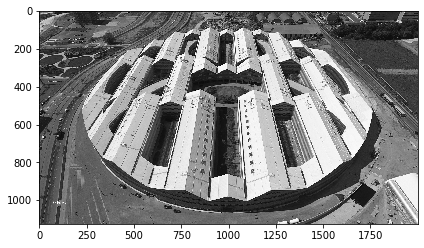

In [3]:
fname = './skoltech.jpg'
image_full = io.imread(fname, as_gray=True, plugin='matplotlib')
io.imshow(image_full);

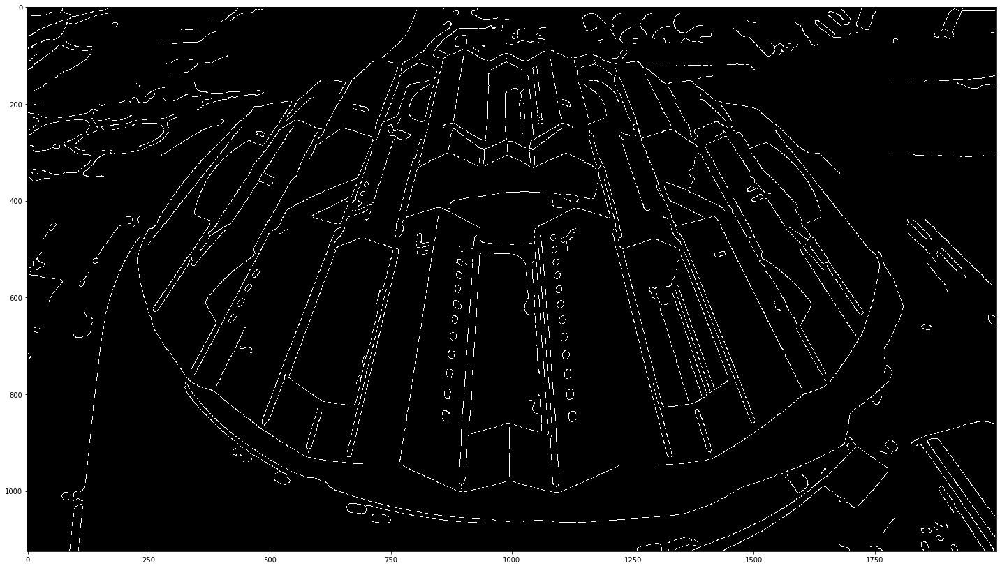

In [18]:
# here we can play with parameters
edges_full = canny(image_full, sigma=4)

plt.figure(figsize=[20, 20])
io.imshow(edges_full);

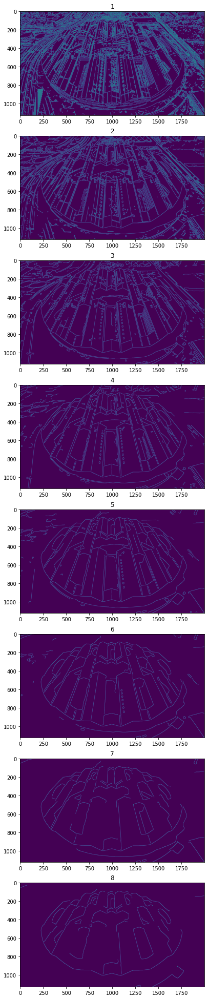

In [19]:
max_sigma = 9

fig, ax = plt.subplots(max_sigma-1, 1, figsize=[(max_sigma-1)*10, 35])

for s in range(1, max_sigma):
    ax[s-1].imshow(canny(image_full, sigma=s))
    ax[s-1].set_title(str(s))
plt.show()

####  The effect of downsampling

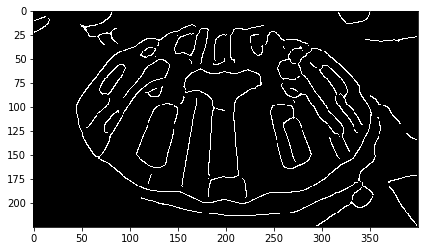

In [29]:
from skimage.transform import rescale
image_scaled = rescale(image_full, .2)
edges_scaled = canny(image_scaled, sigma=4)
io.imshow(edges_scaled);

It seems that the original image is a better choice for line detection

In [20]:
image, edges = image_full, edges_full
# image, edges = image_scaled, edges_scaled

### Step 2: run Hough 

In [22]:
from skimage.transform import hough_line, hough_line_peaks

In [25]:
# two auxilary functions
def get_line(a, b, x_lim, y_lim=None):
    x = np.linspace(*x_lim)
    y = a * x + b
    if y_lim is not None:
        y = y[y>=y_lim[0]]
        y = y[y<=y_lim[1]]
    return x, y

def hough_thetaro_to_ab(theta, ro):
    a = -1 /np.tan(theta)
    b = ro / np.sin(theta)
    return a, b

In [23]:
# all possible lines
h_all, theta_all, ro_all = hough_line(edges)

In [26]:
# automatically selected set of lines
# it could be a good idea to play with min_distance, min_angle, num_peaks
h_selected, theta_selected, ro_selected = hough_line_peaks(h_all, theta_all, ro_all)

In [27]:
len(h_selected)

12

#### Plot the detected lines
(and play with the parameters of hough_line_peaks if needed)

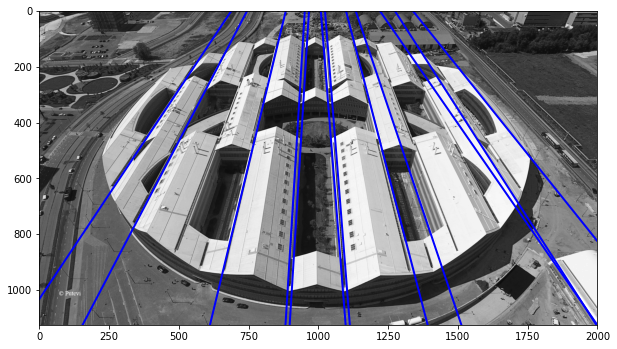

In [28]:
y_max, x_max = edges.shape

plt.figure(figsize = (10,8))
plt.imshow(image, cmap=cm.gray)

for theta, ro in zip(theta_selected, ro_selected):
    a, b = hough_thetaro_to_ab(theta, ro)
    plt.plot(*get_line(a, b, [0, x_max]), 'b', lw=2)

plt.xlim([0, x_max])
plt.ylim([y_max, 0])
plt.show()

In [30]:
y_max, x_max

(1125, 2000)

## Step 3: Filter lines

 - We have a couple of noisy lines which must be removed before ProjectiveTransform.
 - We need a set lines with a common vanishing point to make them parallel. 
 - These lines must belong to a line in a-b Hough space and to a sin in theta-ro space. 

Text(0, 0.5, 'b')

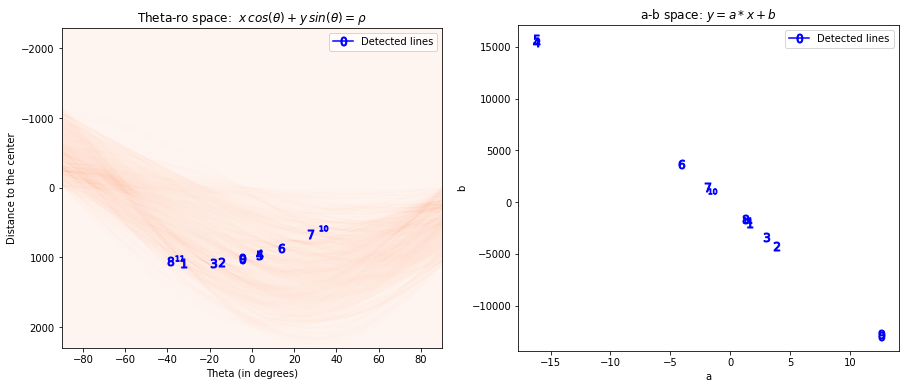

In [33]:
import itertools

fig, ax = plt.subplots(1, 2, figsize=(15, 6))
ax[0].imshow(h_all, cmap=cm.Reds, aspect=0.033,
             extent=[np.rad2deg(theta_all.min()), np.rad2deg(theta_all.max()), 
                                ro_all.max(), ro_all.min()])

for i, (theta, ro) in enumerate(zip(theta_selected, ro_selected)):
    marker = '${}$'.format(i)
    ax[0].plot(np.rad2deg(theta), ro, 'b', marker=marker, ms=9)
    a, b = hough_thetaro_to_ab(theta, ro)
    ax[1].plot(a, b, 'b', marker=marker, ms=9)


ax[0].set_title(r'Theta-ro space:  $x\,cos(\theta)+ y\,sin(\theta)=\rho$')
ax[0].set_xlabel('Theta (in degrees)')
ax[0].set_ylabel('Distance to the center')
ax[0].legend(['Detected lines'])

ax[1].set_title(r'a-b space: $y = a*x + b$')
ax[1].legend(['Detected lines'])
ax[1].set_xlabel('a')
ax[1].set_ylabel('b')



#### We can use RANSAC algorithm to remove outliers

In [34]:
from skimage.measure import LineModelND, ransac

In [36]:
# convert all lines to a-b space
ab_selected = np.array(
    [hough_thetaro_to_ab(theta, ro)
     for theta, ro in zip(theta_selected, ro_selected)]
)

In [111]:
# look for inliers using a linear model
model, inliers = ransac(ab_selected, LineModelND, min_samples=3, residual_threshold=0.05)

In [113]:
model.params
# -1.72438278e-0 * 1.55876310e+01 +  -2.68493778e+02

(array([-1.72438278e-01, -2.68493778e+02]), array([-0.00102264,  0.99999948]))

In [ ]:
b = a * var + var2

In [102]:
ab_selected = #[[a,b]]

array([[ 1.26353228e+01, -1.29374853e+04],
       [ 1.55876310e+00, -1.98665603e+03],
       [ 3.84428328e+00, -4.22537415e+03],
       [ 2.97086493e+00, -3.36891673e+03],
       [-1.62587960e+01,  1.54702692e+04],
       [-1.62587960e+01,  1.57146652e+04],
       [-4.14127755e+00,  3.65826694e+03],
       [-1.90847045e+00,  1.42126196e+03],
       [ 1.24753083e+00, -1.67036661e+03],
       [ 1.26353228e+01, -1.27473214e+04],
       [-1.50016546e+00,  1.03239279e+03],
       [ 1.44457460e+00, -1.76346138e+03]])

In [55]:
inliers, np.sum(inliers)

(array([False,  True,  True,  True,  True, False,  True,  True,  True,
         True,  True, False]),
 9)

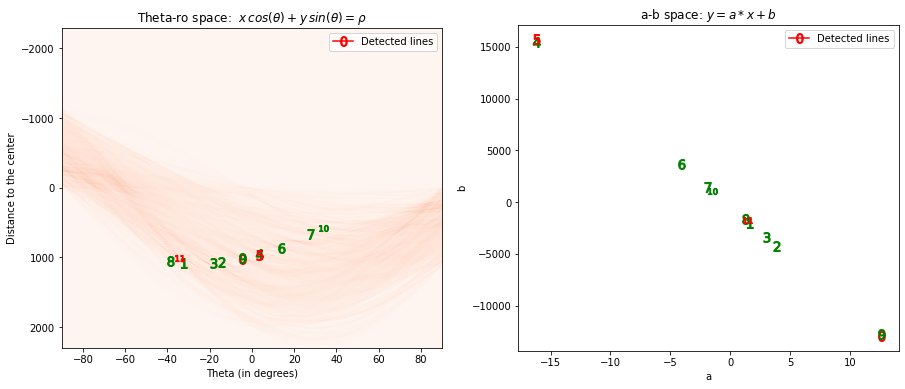

In [56]:
fig, ax = plt.subplots(1, 2, figsize=(15, 6))
ax[0].imshow(h_all, cmap=cm.Reds, aspect=0.033,
             extent=[np.rad2deg(theta_all.min()), np.rad2deg(theta_all.max()), 
                                ro_all.max(), ro_all.min()])

for i, (theta, ro) in enumerate(zip(theta_selected, ro_selected)):
    marker = '${}$'.format(i)
    color = 'g' if inliers[i] else 'r'
    ax[0].plot(np.rad2deg(theta), ro, color, marker=marker, ms=10)
    a, b = hough_thetaro_to_ab(theta, ro)
    ax[1].plot(a, b, color, marker=marker, ms=10)

    
ax[0].set_title(r'Theta-ro space:  $x\,cos(\theta)+ y\,sin(\theta)=\rho$')
ax[0].set_xlabel('Theta (in degrees)')
ax[0].set_ylabel('Distance to the center')
ax[0].legend(['Detected lines'])

ax[1].set_title(r'a-b space: $y = a*x + b$')
ax[1].legend(['Detected lines'])
ax[1].set_xlabel('a')
ax[1].set_ylabel('b')
plt.show()

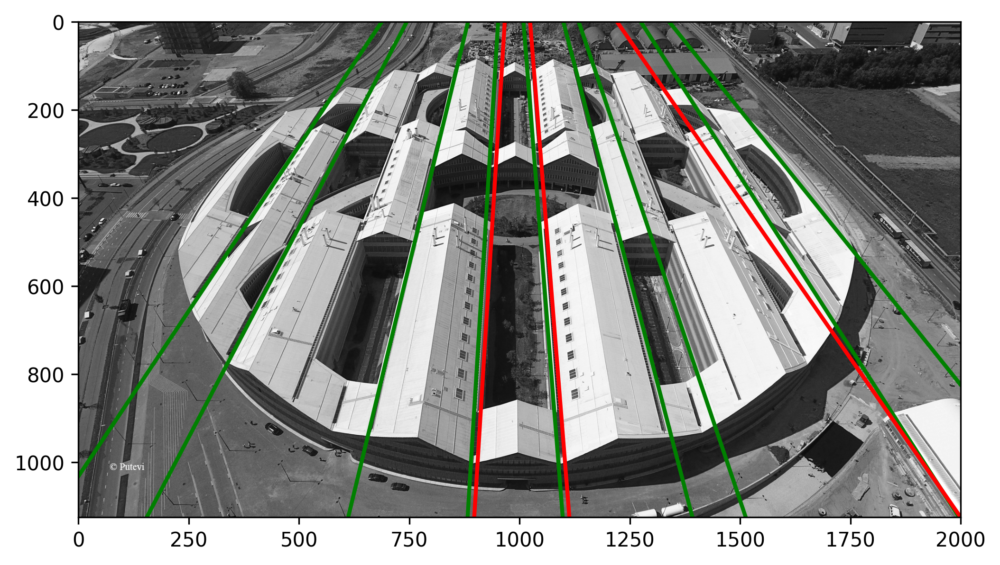

In [59]:
plt.figure(figsize = (8,5), dpi=300)
plt.imshow(image, cmap=cm.gray)
for i, (theta, ro) in enumerate(zip(theta_selected, ro_selected)):
    a, b = hough_thetaro_to_ab(theta, ro)
    color = 'g' if inliers[i] else 'r'
    plt.plot(*get_line(a, b, [0, x_max]), color, lw=2)

plt.xlim([0, x_max])
plt.ylim([y_max, 0])
plt.show()

## Step 4: Calculate the ProjectiveTransform

In [60]:
from skimage.transform import ProjectiveTransform, warp, AffineTransform

In [85]:
lines_ab_final = ab_selected[inliers]

In [86]:
len(lines_ab_final)

9

In [87]:
lines_ab_final

array([[ 1.55876310e+00, -1.98665603e+03],
       [ 3.84428328e+00, -4.22537415e+03],
       [ 2.97086493e+00, -3.36891673e+03],
       [-1.62587960e+01,  1.54702692e+04],
       [-4.14127755e+00,  3.65826694e+03],
       [-1.90847045e+00,  1.42126196e+03],
       [ 1.24753083e+00, -1.67036661e+03],
       [ 1.26353228e+01, -1.27473214e+04],
       [-1.50016546e+00,  1.03239279e+03]])

#### let us fix the coordinates of green lines for the bottom line (y=y_max) and make green lines ~~great~~ parallel again

In [88]:
points_current = []
points_desired = []

for i, ab in enumerate(lines_ab_final):
    # the points for the top of the image (y=0)
    x_0 = -ab[1] / ab[0]
    points_current.append([x_0, 0])
    points_desired.append([x_0, 0])
    # the points for the bottom of the image (y=y_max)
    points_current.append([(y_max - ab[1]) / ab[0], y_max])
    points_desired.append([x_0, y_max])
    
points_current = np.array(points_current)
points_desired = np.array(points_desired)

In [89]:
tform = ProjectiveTransform()
tform.estimate(points_desired, points_current)
image_warped = warp(image, tform)

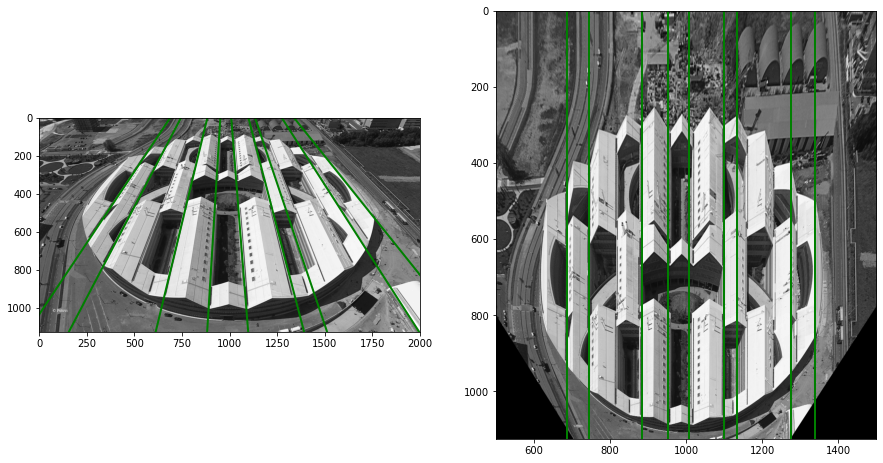

In [90]:
fig, ax = plt.subplots(1, 2, figsize=(15, 9))
ax[0].imshow(image, cmap=cm.gray)
ax[1].imshow(image_warped, cmap=cm.gray)

for i in range(len(points_current)//2):
    ax[0].plot(*points_current[i*2:i*2+2].T, 'g', lw=2)
    ax[1].plot(*points_desired[i*2:i*2+2].T, 'g', lw=2)

ax[0].set_xlim([0, x_max])
ax[0].set_ylim([y_max, 0])

ax[1].set_xlim([500, 1500])
ax[1].set_ylim([y_max, 0])

plt.show()

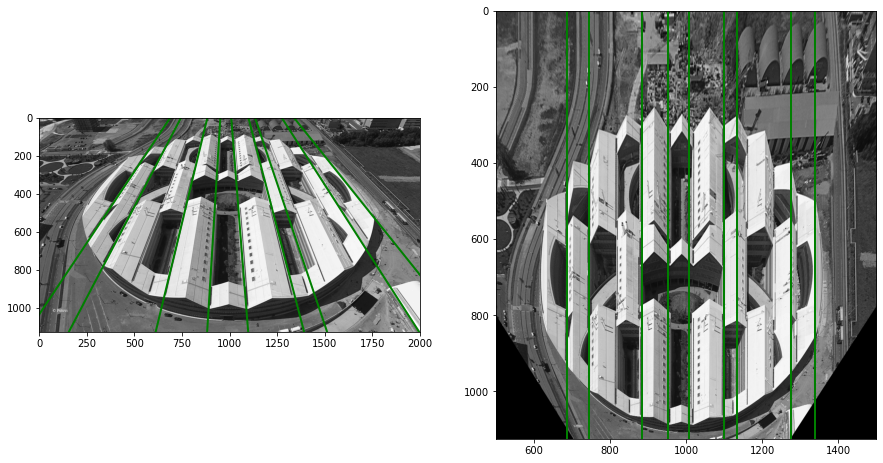

In [91]:
fig, ax = plt.subplots(1, 2, figsize=(15, 9))
ax[0].imshow(image, cmap=cm.gray)
ax[1].imshow(image_warped, cmap=cm.gray)

for i in range(len(points_current)//2):
    ax[0].plot(*points_current[i*2:i*2+2].T, 'g', lw=2)
    ax[1].plot(*points_desired[i*2:i*2+2].T, 'g', lw=2)

ax[0].set_xlim([0, x_max])
ax[0].set_ylim([y_max, 0])

ax[1].set_xlim([500, 1500])
ax[1].set_ylim([y_max, 0])

plt.show()

## Finally, plot the images in RGB

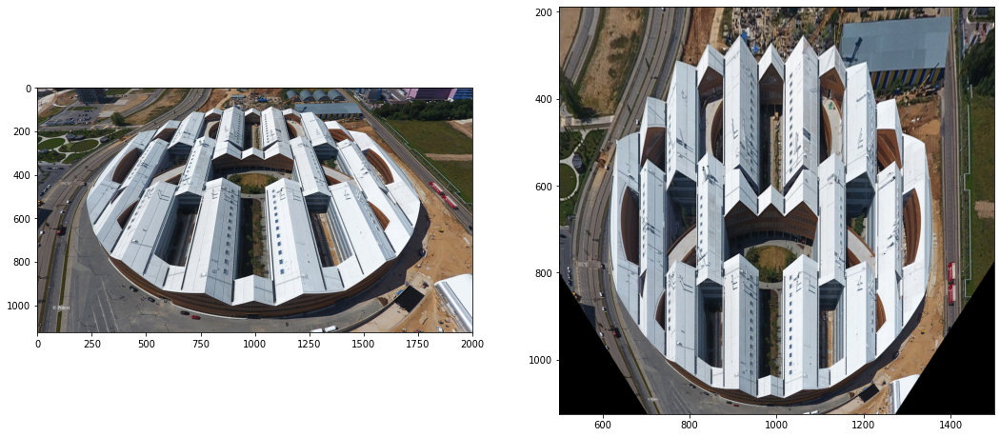

In [92]:
image_rgb = io.imread(fname, plugin='matplotlib')

fig, ax = plt.subplots(1, 2, figsize=(18, 9))
ax[0].imshow(image_rgb)
ax[1].imshow(warp(image_rgb, tform))

ax[0].set_xlim([0, x_max])
ax[0].set_ylim([y_max, 0])

ax[1].set_xlim([x_max * 0.25, x_max * 0.75])
ax[1].set_ylim([y_max, y_max/6])

plt.show()

In [93]:
def parallelize_image(fname, canny_sigma=3, 
                      hough_min_distance=9, hough_min_angle=10,
                      ransac_min_samples=5, ransac_residual_threshold=0.05,
                      hough_num_peaks=10000, cut=False
                     ):
    
    img = io.imread(fname, as_gray=True, plugin='matplotlib')
    
    edges_full = canny(img, sigma=canny_sigma)
    
    image, edges = img, edges_full
    y_max, x_max = edges.shape

    h_all, theta_all, ro_all = hough_line(edges)
    h_selected, theta_selected, ro_selected = hough_line_peaks(h_all, theta_all, ro_all, 
                                min_distance=hough_min_distance, min_angle=hough_min_angle, num_peaks=hough_num_peaks)
    
    ab_selected = np.array(
        [hough_thetaro_to_ab(theta, ro) for theta, ro in zip(theta_selected, ro_selected)]
    )
    
    model, inliers = ransac(ab_selected, LineModelND, 
                min_samples=ransac_min_samples, residual_threshold=ransac_residual_threshold)
    lines_ab_final = ab_selected[inliers]
    
    points_current = []
    points_desired = []

    for i, ab in enumerate(lines_ab_final):
        
        x_0 = -ab[1] / ab[0]
        x = (y_max - ab[1]) / ab[0]
        
        points_current.append([x_0, 0])
        points_desired.append([x_0, 0])
        points_current.append([x, y_max])
        points_desired.append([x_0, y_max])

    points_current = np.array(points_current)
    points_desired = np.array(points_desired)
    
    tform = ProjectiveTransform()
    tform.estimate(points_desired, points_current)
    
    image_rgb = io.imread(fname, plugin='matplotlib')

    fig, ax = plt.subplots(3, 2, figsize=(15, 15))
    ax[0, 0].imshow(image_rgb)
    ax[0, 1].imshow(edges_full)
    ax[2, 1].imshow(warp(image_rgb, tform))

    ax[0, 0].set_xlim([0, x_max])
    ax[0, 0].set_ylim([y_max, 0])

    if cut:
        ax[2, 1].set_xlim([x_max * 0.25, x_max * 0.75])
        ax[2, 1].set_ylim([y_max, y_max/6])
    
    
    ax[1, 0].imshow(h_all, cmap=cm.Reds, aspect=0.033,
             extent=[np.rad2deg(theta_all.min()), np.rad2deg(theta_all.max()), 
                                ro_all.max(), ro_all.min()])

    for i, (theta, ro) in enumerate(zip(theta_selected, ro_selected)):
        marker = '${}$'.format(i)
        color = 'g' if inliers[i] else 'r'
        ax[1, 0].plot(np.rad2deg(theta), ro, color, marker=marker, ms=10)
        a, b = hough_thetaro_to_ab(theta, ro)
        ax[1, 1].plot(a, b, color, marker=marker, ms=10)


    ax[1, 0].set_title(r'Theta-ro space:  $x\,cos(\theta)+ y\,sin(\theta)=\rho$')
    ax[1, 0].set_xlabel('Theta (in degrees)')
    ax[1, 0].set_ylabel('Distance to the center')
    ax[1, 0].legend(['Detected lines'])

    ax[1, 1].set_title(r'a-b space: $y = a*x + b$')
    ax[1, 1].legend(['Detected lines'])
    ax[1, 1].set_xlabel('a')
    ax[1, 1].set_ylabel('b')
    
    
    ax[2, 0].imshow(image, cmap=cm.gray)

    for i in range(len(points_current)//2):
        ax[2, 0].plot(*points_current[i*2:i*2+2].T, 'g', lw=2)
    
#     print(points_current)

    ax[2, 0].set_xlim([0, x_max])
    ax[2, 0].set_ylim([y_max, 0])

    for i in range(3):
        for j in range(2):
            ax[i, j].set_xticks([])
            ax[i, j].set_yticks([])

    plt.suptitle('sigma:{}, min_dist:{}, min_angle:{}, min_samples:{}, threshold:{}'.format(
        canny_sigma, hough_min_distance, hough_min_angle, ransac_min_samples, ransac_residual_threshold
    ))
    
    plt.show()
    
    return tform

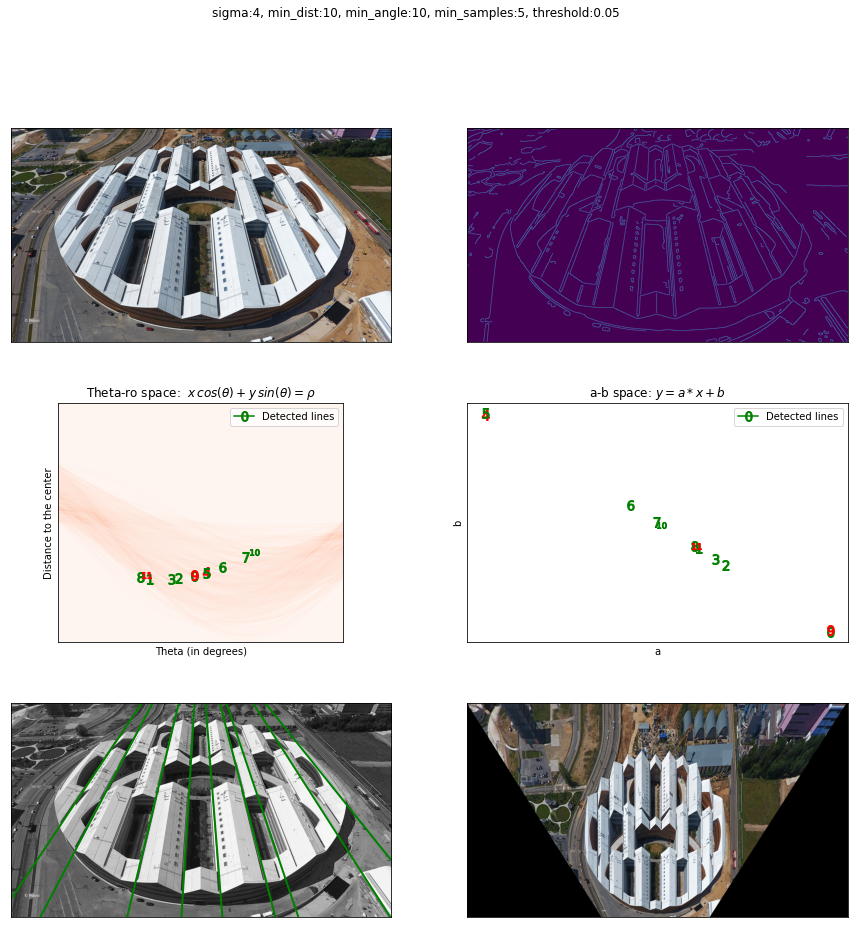

In [94]:
tform = parallelize_image('./skoltech.jpg', canny_sigma=4, 
                      hough_min_distance=10, hough_min_angle=10,
                      ransac_min_samples=5, ransac_residual_threshold=0.05)

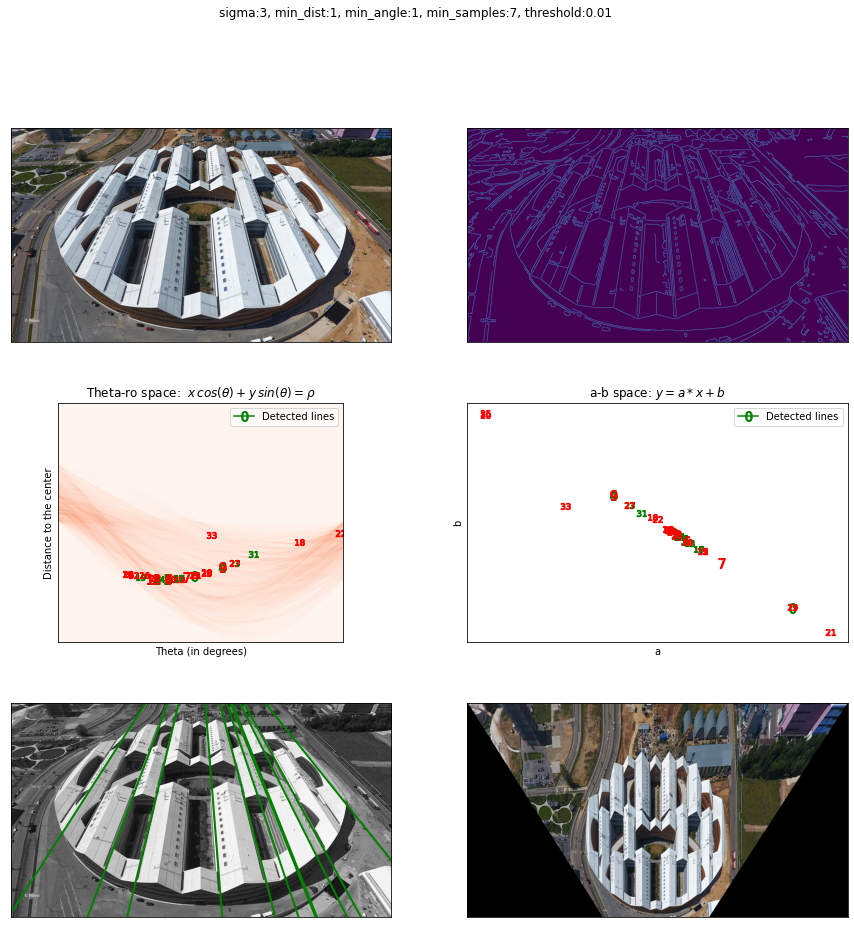

In [95]:
tform = parallelize_image('./skoltech.jpg', canny_sigma=3, 
                      hough_min_distance=1, hough_min_angle=1,
                      ransac_min_samples=7, ransac_residual_threshold=0.01)

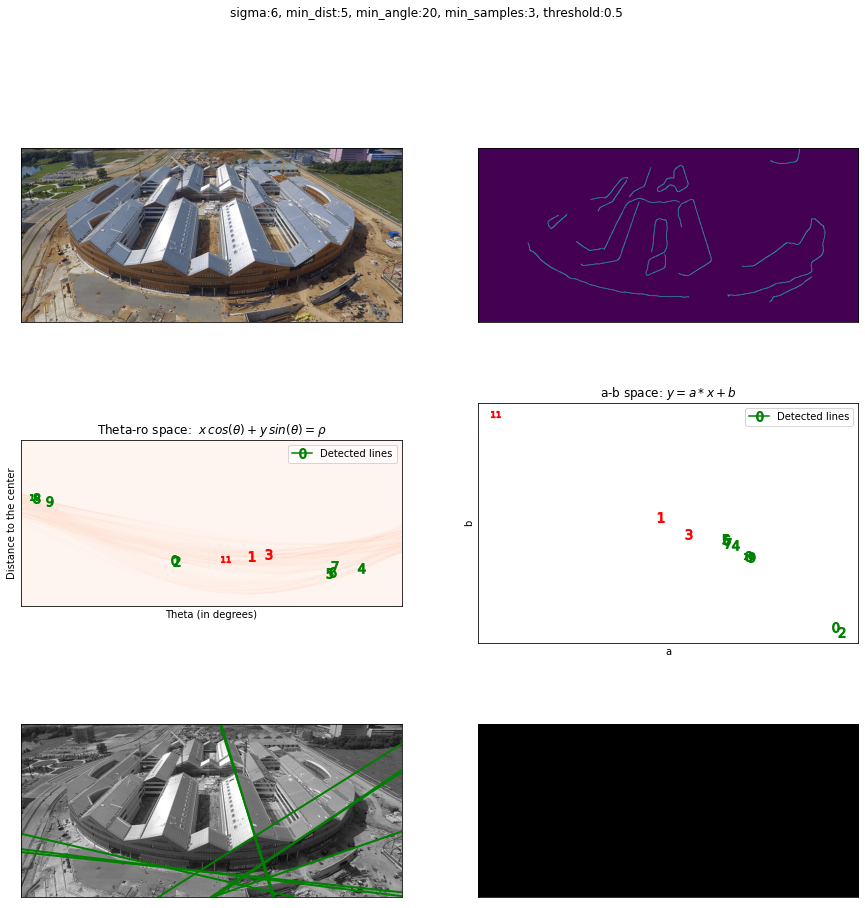

In [96]:
tform = parallelize_image('./skoltech2.jpg', canny_sigma=6, 
                      hough_min_distance=5, hough_min_angle=20,
                      ransac_min_samples=3, ransac_residual_threshold=0.5, hough_num_peaks=20)

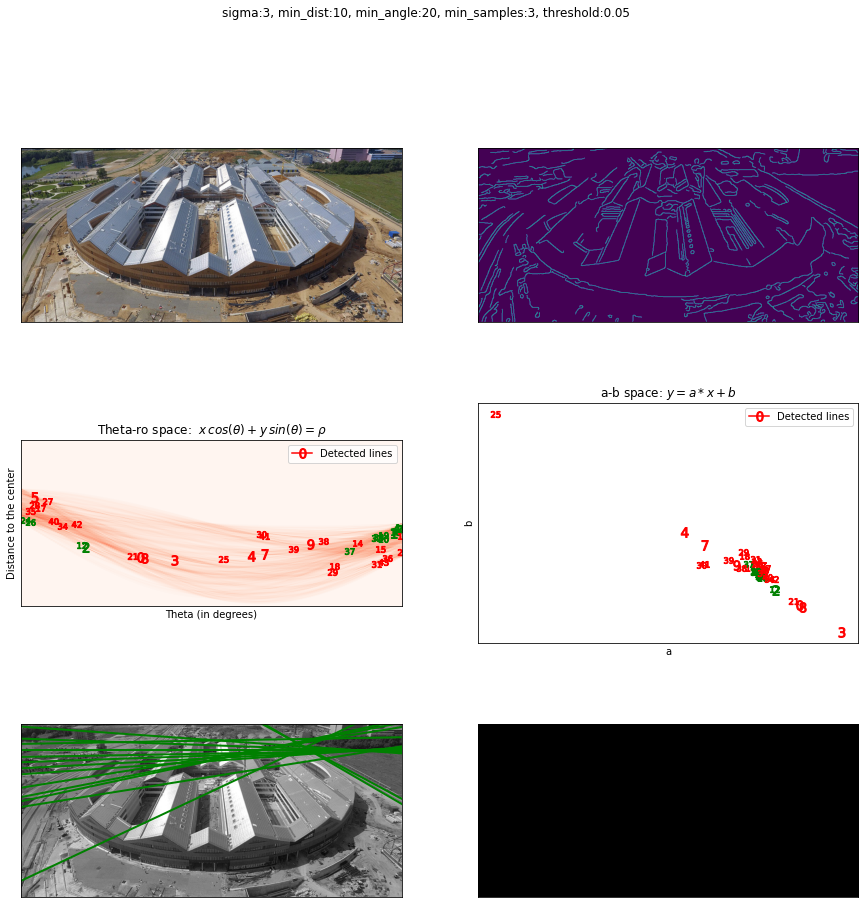

In [97]:
tform = parallelize_image('./skoltech2.jpg', canny_sigma=3, 
                      hough_min_distance=10, hough_min_angle=20,
                      ransac_min_samples=3, ransac_residual_threshold=0.05, hough_num_peaks=10000)

In [114]:
import cv2
from cv2 import aruco


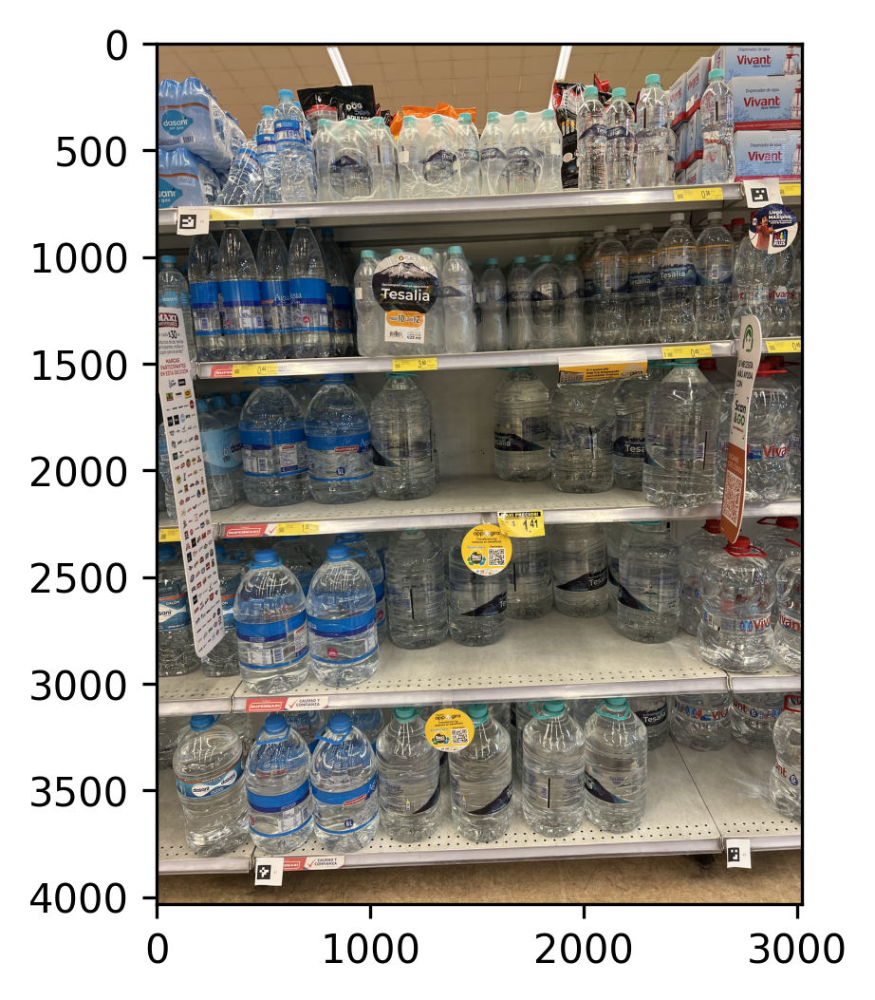

In [115]:
frame = cv2.imread("shop2.jpeg")[:,:,::-1]
plt.figure(dpi=300)
plt.imshow(frame)

In [116]:
gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
corners, ids, rejectedImgPoints = aruco.detectMarkers(gray, 
                                                      aruco.Dictionary_get(aruco.DICT_4X4_1000), 
                                                      parameters=aruco.DetectorParameters_create())
print(ids)
print(corners)

[[47]
 [49]
 [46]
 [48]]
(array([[[ 474., 3851.],
        [ 536., 3848.],
        [ 531., 3915.],
        [ 470., 3917.]]], dtype=float32), array([[[2677., 3770.],
        [2729., 3767.],
        [2732., 3832.],
        [2677., 3835.]]], dtype=float32), array([[[111., 800.],
        [186., 800.],
        [182., 867.],
        [107., 866.]]], dtype=float32), array([[[2784.,  678.],
        [2855.,  676.],
        [2868.,  737.],
        [2794.,  740.]]], dtype=float32))


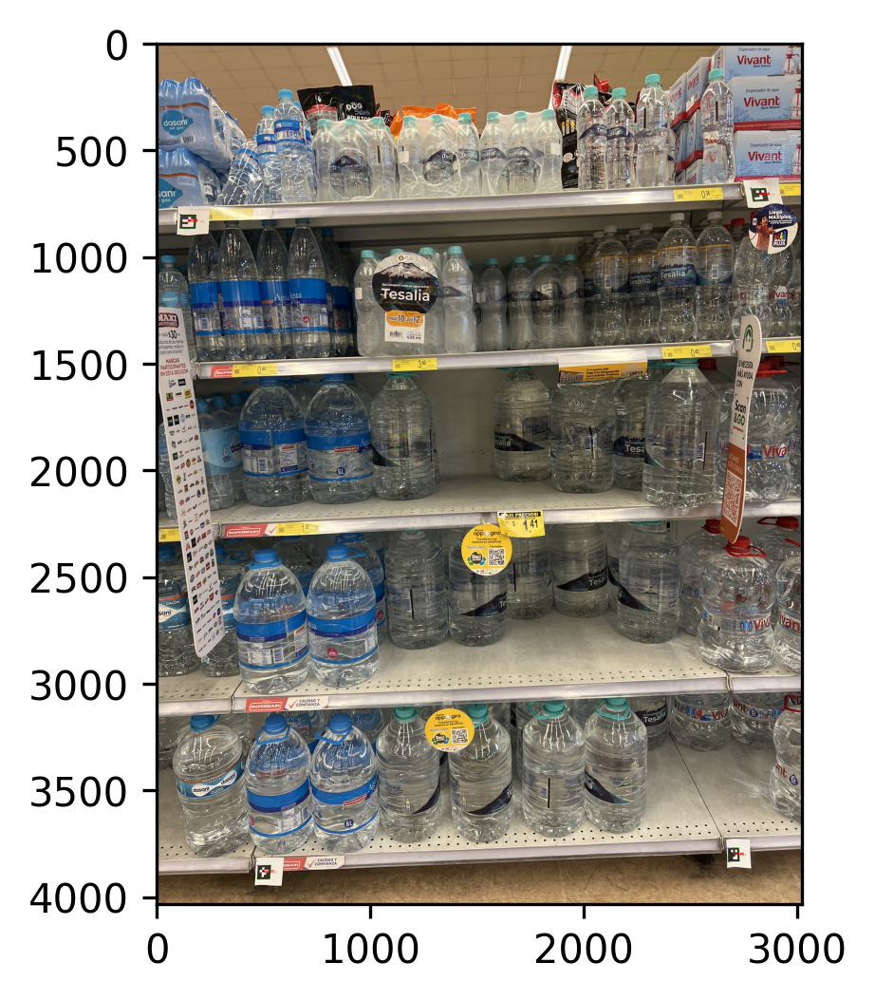

In [118]:
frame_markers = aruco.drawDetectedMarkers(frame.copy(), corners, ids)
plt.figure(dpi=300)
plt.imshow(frame_markers)

In [119]:
src = np.mean(corners, axis=2).squeeze()
src

array([[ 502.75, 3882.75],
       [2703.75, 3801.  ],
       [ 146.5 ,  833.25],
       [2825.25,  707.75]], dtype=float32)

In [134]:
src = np.mean(corners, axis=2).squeeze()
k = 2
dst_points = np.array([[0,    k*1000], 
                       [1000, k*1000], 
                       [0,    0], 
                       [1000, 0]]).astype(np.float32) + 100
H = cv2.getPerspectiveTransform(src, dst_points)
# cv2.findHomography()

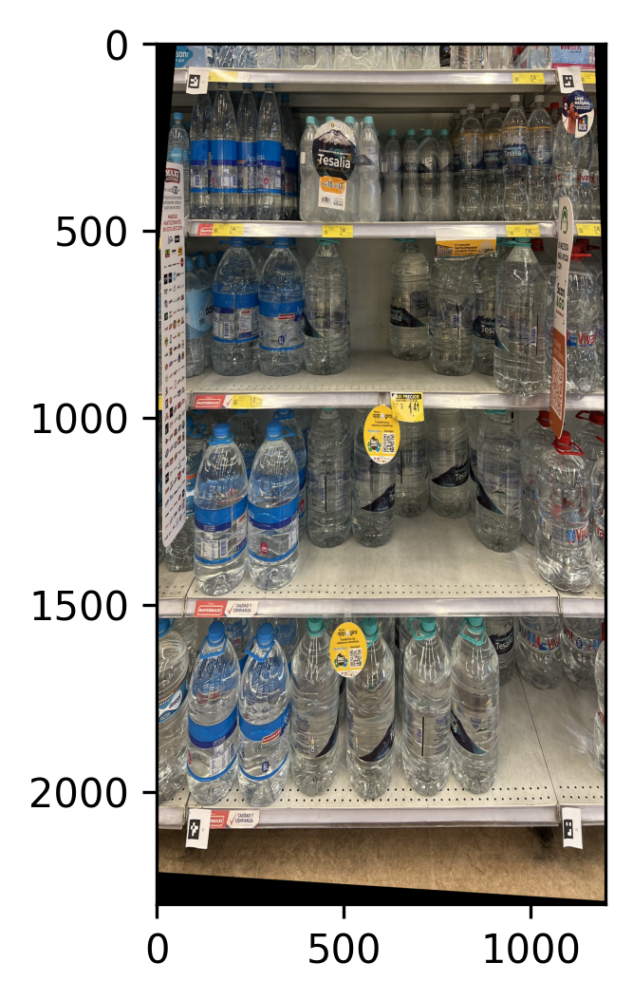

In [135]:
im2 = cv2.warpPerspective(frame, H, (1200, int(1000*k) + 300))
plt.figure(dpi=300)
plt.imshow(im2)

In [ ]:
cv2.solvePnP()